In [1]:
import glob, os
import pathlib
import json
import yaml

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import collections
from pprint import pprint
import re
import dask

from dotty_dict import dotty

%matplotlib inline

In [2]:
# avoid the module's method call deprecation
try:
    collectionsAbc = collections.abc
except AttributeError:
    collectionsAbc = collections

Configuring Juputer's options to present more things to the output.

In [3]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [4]:
processing_category = "gaussianized"

# Load Data GroundTruth

## Path declaration

In [5]:
path_config = os.path.join(os.getcwd(), os.pardir, "configuration.yaml")

In [6]:
path_app = os.path.join(os.path.abspath(os.getcwd()), os.pardir)
# path = os.path.join(path, 'danceability', 'features', 'mp3')
print('Current path:', path_app)
print('Type:', type(path_app))

Current path: /home/iotlab_user/Desktop/google2020/gsoc_ml_infrastructure/notebooks/..
Type: <class 'str'>


## Count all the JSON data included in files

In [7]:
counter = 0
for root, dirs, files in os.walk(path_app):
    for file in files:
        if file.endswith(".json"):
#             print(os.path.join(root, file))
            counter += 1
            
print('counted json files:', counter)

counted json files: 10461


## Load the GroundTruth file

In [8]:
with open(os.path.join(path_app, 'acousticbrainz-datasets/danceability/metadata/groundtruth.yaml'), 'r') as stream:
    try:
        groundTr_data = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)

In [9]:
len(groundTr_data['groundTruth'].keys())

225

## Load config

In [10]:
with open(path_config, 'r') as conf_stream:
    try:
        config_data = yaml.safe_load(conf_stream)
    except yaml.YAMLError as exc:
        print(exc)

In [11]:
config_data

{'ground_truth_directory': 'acousticbrainz-datasets',
 'class_dir': 'danceability',
 'enumeration_columns': ['tonal_chords_key',
  'tonal_chords_scale',
  'tonal_key_key',
  'tonal_key_scale'],
 'remove_columns': ['json_directory', 'track'],
 'exports_directory': 'exports',
 'evaluations_directory': 'evaluations',
 'tracks_in_csv_format': 'tracks_csv',
 'delete_logs': True,
 'log_directory': 'logs',
 'logging_level': 0,
 'scaling': 'standard_scaled',
 'excludedDescriptors': ['metadata.tags*'],
 'processing': {'raw': [],
  'basic': {'preprocess': [{'transfo': 'remove',
     'params': {'descriptorNames': ['metadata.*',
       '*dmean*',
       '*dvar*',
       '*.min',
       '*.max',
       '*cov',
       'tonal.thpcp',
       'lowlevel.spectral_energyband_high.*',
       'lowlevel.silence_rate*']}},
    {'transfo': 'enumerate',
     'params': {'descriptorNames': ['tonal.chords_key',
       'tonal.chords_scale',
       'tonal.key_key',
       'tonal.key_scale']}}]},
  'lowlevel': {'prep

## Check the unique folders with tracks and sort them alphabetically

In [12]:
labeled_tracks = groundTr_data['groundTruth']

### Split the keys in Folder - Track Name

In [13]:
folders = []
for key in labeled_tracks:
    key = key.split('/')
    folders.append(key[0])

In [14]:
print(folders[:15])

['Alternative', 'Alternative', 'Alternative', 'Alternative', 'Alternative', 'Alternative', 'Alternative', 'Alternative', 'Alternative', 'Blues', 'Blues', 'Blues', 'Blues', 'Blues', 'Blues']


### Check the folders

In [15]:
folders = set(folders)
folders = list(folders)
folders.sort()
folders

['Alternative',
 'Blues',
 'Classical',
 'Country',
 'Dance and House',
 'Folk and New Age',
 'Hip-Hop and Rap',
 'House & Garage and Grime',
 'Jazz',
 'Jungle and D&B',
 'Latin',
 'Pop',
 'R&B and Soul',
 'Reggae',
 'Rock and Metal',
 'Techno and Electro',
 'Vocal and Acapella']

## Class Name retrieved from GT file

In [16]:
class_name = groundTr_data['className']

In [17]:
class_name

'danceability'

# Load a DF containing all the tracks (features + GT data)

In [18]:
path_features = os.path.join(path_app, 'acousticbrainz-datasets', 'danceability', 'features')
low_level_dir = ''
if len(os.listdir(path_features)) == 0:
    print("Directory is empty")
else:
    print("Directory is not empty")
    directory_contents = os.listdir(path_features)
    if 'mp3' in directory_contents:
        low_level_dir = 'mp3'
    elif 'orig' in directory_contents:
        low_level_dir = 'orig'
    else:
        low_level_dir = ''
        print('There is no valid low-level data inside the features directory')
print('Low-level directory:', low_level_dir)

Directory is not empty
Low-level directory: mp3


In [19]:
path_low_level = os.path.join(path_app, 'acousticbrainz-datasets/danceability', 'features', low_level_dir)

In [20]:
# path_low_level

In [21]:
if low_level_dir != '':
    tracks = []
    for key, value in labeled_tracks.items():
        track_dict = {}
        key = key.split('/')
        path_tracks = os.path.join(path_low_level, key[0])
        for f_name in os.listdir(path_tracks):
            if f_name.startswith(key[1]):
                track_dict['json_directory'] = key[0]
                track_dict['track'] = key[1]
                track_dict['track_path'] = os.path.join(path_low_level, key[0], f_name)
                track_dict['danceability'] = value
        tracks.append(track_dict)

In [22]:
len(tracks)

225

In [23]:
df_tracks = pd.DataFrame(data=tracks)

Plot the track's paths

In [24]:
df_tracks.head()

,json_directory,track,track_path,danceability
0,Alternative,02 Happy Birthday - Altered Images.mp3,/home/iotlab_user/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/02 Happy Birthday - Altered Images.mp3.json,danceable
1,Alternative,03 How Soon Is Now - Smiths.mp3,/home/iotlab_user/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/03 How Soon Is Now - Smiths.mp3.json,not_danceable
2,Alternative,04 Pearly Dewdrops' Drops - Cocteau Twins.mp3,/home/iotlab_user/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/04 Pearly Dewdrops' Drops - Cocteau Twins.mp3.json,not_danceable
3,Alternative,06 Mr Brightside - Killers.mp3,/home/iotlab_user/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/06 Mr Brightside - Killers.mp3.json,danceable
4,Alternative,06 Song 2 - Blur.mp3,/home/iotlab_user/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/06 Song 2 - Blur.mp3.json,danceable


Check the className distribution of the data based on the 'genre_category'

Data distribution based on the genres

In [25]:
df_tracks['json_directory'].value_counts()

Jungle and D&B              22
Latin                       22
Dance and House             21
Hip-Hop and Rap             19
Vocal and Acapella          17
Techno and Electro          16
Folk and New Age            16
R&B and Soul                13
Rock and Metal              13
Reggae                      12
House & Garage and Grime    10
Alternative                  9
Blues                        8
Country                      8
Pop                          7
Jazz                         6
Classical                    6
Name: json_directory, dtype: int64

# Features DF

## Clean the low-level from the unnecessary features and load the rest to a list

Each index/item of the list contains the cleaned dictionary low-level data, flattened by the relevant function

In [26]:
def flatten_dict_full(d, sep="_"):
    obj = collections.OrderedDict()

    def recurse(t, parent_key=""):
        
        if isinstance(t, list):
            for i in range(len(t)):
                recurse(t[i], parent_key + sep + str(i) if parent_key else str(i))
        elif isinstance(t,dict):
            for k, v in t.items():
                recurse(v, parent_key + sep + k if parent_key else k)
        else:
            obj[parent_key] = t
    recurse(d)

    return obj

In [27]:
list_feats_tracks = []

In [28]:
list_feats_tracks.clear()  # clear the list if it not empty

counter_items_transformed = 0
for index, row in df_tracks.iterrows():
    f = open(row['track_path'])
    data_feats_item = json.load(f)

    # remove unnecessary data
    if 'beats_position' in data_feats_item['rhythm']:
      del data_feats_item['rhythm']['beats_position']
    
    # data dictionary transformed to a fully flattened dictionary
    data_feats_item = flatten_dict_full(data_feats_item)

    # append to a full tracks features pandas df
    list_feats_tracks.append(dict(data_feats_item))
    
    counter_items_transformed += 1

print('Items parsed and transformed:', counter_items_transformed)

Items parsed and transformed: 225


In [29]:
len(list_feats_tracks)

225

In [30]:
# list_feats_tracks

## Transform the low-level features instances to DF

In [31]:
df_feats_tracks = pd.DataFrame(list_feats_tracks, columns=list_feats_tracks[0].keys())

In [32]:
df_feats_tracks.head()

lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0                   0.940232                        2.766660   
1                   0.918468                        2.675291   
2                   0.903639                        2.680212   
3                   0.964146                        2.334805   
4                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.126804                               0.123771   
3                             0.096527                               0.074531   
4                             0.115602                               0.095726   

   lowlevel_barkbands_flatness_db_min  lowlevel_barkbands_flatness_db_var  \
0                            0.040839                            0.010974   
1                            0.025457                            0.001940   
2                            0.045240                  

In [33]:
df_feats_tracks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225 entries, 0 to 224
Columns: 2674 entries, lowlevel_average_loudness to tonal_key_scale
dtypes: float64(2575), int64(79), object(20)
memory usage: 4.6+ MB


In [34]:
df_feats_tracks.shape

(225, 2674)

## Concatenate the tracks DF with the feats DF

In [35]:
df_tracks.columns

Index(['json_directory', 'track', 'track_path', 'danceability'], dtype='object')

In [36]:
df_tracks.drop(labels=['track_path','json_directory',  'track'], axis=1, inplace=True)

In [37]:
df_full_tracks = pd.concat([df_tracks, df_feats_tracks], axis=1)

In [38]:
df_full_tracks_unshuffled = df_full_tracks.copy()

In [39]:
df_full_tracks_unshuffled.head(20)

danceability  lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0       danceable                   0.940232                        2.766660   
1   not_danceable                   0.918468                        2.675291   
2   not_danceable                   0.903639                        2.680212   
3       danceable                   0.964146                        2.334805   
4       danceable                   0.923212                        2.654776   
5       danceable                   0.941991                        2.767574   
6       danceable                   0.902590                        2.772622   
7       danceable                   0.928862                        3.195728   
8       danceable                   0.957799                        2.423920   
9   not_danceable                   0.149702                        2.702237   
10  not_danceable                   0.572992                        2.709647   
11  not_danceable                   0.346558                        2.699473   
12  not_danceable                   0.789529                        2.387297   
13  not_danceable                   0.578548                        2.520753   
14  not_danceable                   0.412371                        2.489364   
15  not_danceable                   0.030412                        2.409576   
16  not_danceable                   0.759883                        2.742861   
17  not_danceable                   0.159767                        2.214600   
18  not_danceable                   0.130747                        2.618240   
19  not_danceable                   0.001365                        2.723969   

    lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                          4.448297                       5.745806   
1                          4.377324                       6.211648   
2                          4.377909                       5.717108   
3                          3.876004                       6.314280   
4                          4.302909                       6.634628   
5                          4.574121                       7.546346   
6                          4.401102                       8.490385   
7                          5.395492                       8.087739   
8                          3.887601                       4.911675   
9                          4.252785                       6.440696   
10                         4.299592                       6.865311   
11                         4.300869                       6.508003   
12                         3.753475                       5.759385   
13                         3.942565                       6.025081   
14                         3.848130                       6.705011   
15                         3.802984                       6.337692   
16                         4.320489                       7.898330   
17                         3.645819                       3.767899   
18                         4.505101                       4.765617   
19                         4.481985                       5.773226   

    lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                        14.987641                     26.722847   
1                        15.621523                     26.676046   
2                        13.717224                     24.490746   
3                        16.660341                     24.082594   
4                        16.935333                     26.224245   
5                        20.169672                     26.846273   
6                        16.855553                     26.579878   
7                        21.759111                     22.472506   
8                        12.035398                     26.123657   
9                        15.394390                     25.944613   
10                       17.576956                     24.947378   
11                       15.129859   

In [40]:
df_full_tracks_unshuffled.shape

(225, 2675)

Shuffle dataset in the same way gaia does

In [41]:
import random

In [42]:
def shuffle_data(df_ml_data, config):
    """

    :param df_ml_data: (Pandas DataFrame) the data to be shuffled
    :param config: (dict) the configuration data
    :return: (NumPy array) the shuffled data
    """
    df_ml_cols = df_ml_data.columns
    # convert DataFrame to NumPy array
    ml_values = df_ml_data.values
    # shuffle the data
    random.seed(a=config.get("random_seed"))
    random.shuffle(ml_values)
    # convert the NumPy array to DF
    df_ml_shuffle = pd.DataFrame(data=ml_values, columns=df_ml_cols)
    return df_ml_shuffle

In [43]:
df_full_tracks_shuffled = shuffle_data(df_full_tracks_unshuffled, config_data)

In [44]:
df_full_tracks_shuffled.head(20)

danceability lowlevel_average_loudness lowlevel_barkbands_crest_dmean  \
0       danceable                  0.940232                        2.76666   
1   not_danceable                  0.918468                        2.67529   
2   not_danceable                  0.903639                        2.68021   
3       danceable                  0.964146                         2.3348   
4       danceable                  0.940232                        2.76666   
5       danceable                  0.923212                        2.65478   
6   not_danceable                  0.918468                        2.67529   
7       danceable                  0.928862                        3.19573   
8       danceable                  0.957799                        2.42392   
9       danceable                  0.964146                         2.3348   
10      danceable                  0.957799                        2.42392   
11      danceable                   0.90259                        2.77262   
12  not_danceable                  0.572992                        2.70965   
13      danceable                  0.957799                        2.42392   
14  not_danceable                  0.346558                        2.69947   
15  not_danceable                  0.412371                        2.48936   
16      danceable                  0.941991                        2.76757   
17  not_danceable                  0.918468                        2.67529   
18      danceable                  0.923212                        2.65478   
19  not_danceable                  0.789529                         2.3873   

   lowlevel_barkbands_crest_dmean2 lowlevel_barkbands_crest_dvar  \
0                           4.4483                       5.74581   
1                          4.37732                       6.21165   
2                          4.37791                       5.71711   
3                            3.876                       6.31428   
4                           4.4483                       5.74581   
5                          4.30291                       6.63463   
6                          4.37732                       6.21165   
7                          5.39549                       8.08774   
8                           3.8876                       4.91168   
9                            3.876                       6.31428   
10                          3.8876                       4.91168   
11                          4.4011                       8.49039   
12                         4.29959                       6.86531   
13                          3.8876                       4.91168   
14                         4.30087                         6.508   
15                         3.84813                       6.70501   
16                         4.57412                       7.54635   
17                         4.37732                       6.21165   
18                         4.30291                       6.63463   
19                         3.75347                       5.75939   

   lowlevel_barkbands_crest_dvar2 lowlevel_barkbands_crest_max  \
0                         14.9876                      26.7228   
1                         15.6215                       26.676   
2                         13.7172                      24.4907   
3                         16.6603                      24.0826   
4                         14.9876                      26.7228   
5                         16.9353                      26.2242   
6                         15.6215                       26.676   
7                         21.7591                      22.4725   
8                         12.0354                      26.1237   
9                         16.6603                      24.0826   
10                        12.0354                      26.1237   
11                        16.8556                      26.5799   
12                         17.577                      24.9474   
13           

In [45]:
df_full_tracks_shuffled.shape

(225, 2675)

**X data**

In [46]:
X = df_full_tracks_shuffled.drop(labels=[class_name], axis=1)

In [47]:
X.shape

(225, 2674)

**y data**

In [48]:
y = df_full_tracks_shuffled[class_name]

In [49]:
X.head(10)

lowlevel_average_loudness lowlevel_barkbands_crest_dmean  \
0                  0.940232                        2.76666   
1                  0.918468                        2.67529   
2                  0.903639                        2.68021   
3                  0.964146                         2.3348   
4                  0.940232                        2.76666   
5                  0.923212                        2.65478   
6                  0.918468                        2.67529   
7                  0.928862                        3.19573   
8                  0.957799                        2.42392   
9                  0.964146                         2.3348   

  lowlevel_barkbands_crest_dmean2 lowlevel_barkbands_crest_dvar  \
0                          4.4483                       5.74581   
1                         4.37732                       6.21165   
2                         4.37791                       5.71711   
3                           3.876                       6.31428   
4                          4.4483                       5.74581   
5                         4.30291                       6.63463   
6                         4.37732                       6.21165   
7                         5.39549                       8.08774   
8                          3.8876                       4.91168   
9                           3.876                       6.31428   

  lowlevel_barkbands_crest_dvar2 lowlevel_barkbands_crest_max  \
0                        14.9876                      26.7228   
1                        15.6215                       26.676   
2                        13.7172                      24.4907   
3                        16.6603                      24.0826   
4                        14.9876                      26.7228   
5                        16.9353                      26.2242   
6                        15.6215                       26.676   
7                        21.7591                      22.4725   
8                        12.0354                      26.1237   
9                        16.6603                      24.0826   

  lowlevel_barkbands_crest_mean lowlevel_barkbands_crest_median  \
0                       10.8071                         9.69134   
1                       8.78984                         8.10821   
2                       8.95885                         8.11677   
3                       7.98967                         7.19391   
4                       10.8071                         9.69134   
5                          9.25                         8.15896   
6                       8.78984                         8.10821   
7                       9.75541                         9.15615   
8                       8.54725                         7.43972   
9                       7.98967                         7.19391   

  lowlevel_barkbands_crest_min lowlevel_barkbands_crest_var  \
0                      2.79827                      24.1222   
1                        2.419                      12.3851   
2                       2.5383                      14.4556   
3                      2.51051                      11.0312   
4                      2.79827                      24.1222   
5                      2.48979                      18.7252   
6                        2.419                      12.3851   
7                      2.29823                      17.5564   
8                      2.22932                       17.706   
9                      2.51051                      11.0312   

  lowlevel_barkbands_flatness_db_dmean lowlevel_barkbands_flatness_db_dmean2  \
0                            0.0237203                             0.0359584   
1                            0.0216702                             0.0338759   
2                            0.0200293                             0.0327077   
3                            0.0170936                             0.0273881   
4                            0.02

In [50]:
type(y)

pandas.core.series.Series

In [51]:
type(X)

pandas.core.frame.DataFrame

# Preprocessing

In [52]:
def list_descr_handler(descr_list):
    keys_list_handle = []
    for item in descr_list:
        if item.endswith(".*"):
            item = item.replace(".*", "_")
        elif item.startswith("*."):
            item = item.replace("*.", "_")
        else:
            item = item.replace("*", "")
        item = item.replace(".", "_")
        keys_list_handle.append(item)
    return keys_list_handle

In [53]:
def cleaner(config, df):
    cleaning_columns_list = config["excludedDescriptors"]
    cleaning_columns_list = list_descr_handler(cleaning_columns_list)
    print("cleaner for columns: {}".format(cleaning_columns_list))
    df = descr_remover(df, cleaning_columns_list)
    return df

In [54]:
def descr_selector(df, descr_select_list):
    columns_list = list(df.columns)
    columns_sel_list = []
    for item in descr_select_list:
        for sel_item in columns_list:
            if re.search(item, sel_item):
                columns_sel_list.append(sel_item)
    df_select_descr = df[columns_sel_list]
    return df_select_descr

In [55]:
def descr_remover(df, descr_remove_list):
    columns_list = list(df.columns)
    columns_del_list = []
    for item in descr_remove_list:
        for del_item in columns_list:
            if re.search(item, del_item):
                columns_del_list.append(del_item)
    df_used_descr = df.drop(columns=columns_del_list, axis=1)
    return df_used_descr

In [56]:
def descr_enumerator(df, descr_enumerate_list):
    columns_list = list(df.columns)
    columns_enum_list = []
    for item in descr_enumerate_list:
        for sel_item in columns_list:
            if re.search(item, sel_item):
                columns_enum_list.append(sel_item)
    df_cat = df[columns_enum_list]
    print("No. of columns to enumerate: {}".format(len(df_cat.columns)))
    df_cat_oh = pd.get_dummies(df_cat)
    print("No. of columns after enumeration: {}".format(len(df_cat_oh.columns)))
    print("Columns enumerated: {}".format(df_cat_oh.columns))
    df.drop(labels=columns_enum_list, axis=1, inplace=True)
    df_num_oh = pd.concat([df, df_cat_oh], axis=1)
    return df_num_oh

In [57]:
def descr_handling(df, processing):
    if processing["transfo"] == "remove":
        remove_list = list_descr_handler(processing["params"]["descriptorNames"])
        df = descr_remover(df, remove_list)
        print("items removed related to: {}".format(remove_list))
        print()
    if processing["transfo"] == "enumerate":
        enumerate_list = list_descr_handler(processing["params"]["descriptorNames"])
        df = descr_enumerator(df, enumerate_list)
        print("items enumerated related to:: {}".format(enumerate_list))
        print()
    if processing["transfo"] == "select":
        select_list = list_descr_handler(processing["params"]["descriptorNames"])
        df = descr_selector(df, select_list)
        print("items selected related to: {}".format(select_list))
        print()
    return df

In [58]:
def processing_01(config, process, df):
    print("Processing: {}".format(process))
    config = dotty(config)
    print(config["processing.{}".format(process)])
    print()
    if "preprocess" in config["processing"]["{}".format(process)].keys():
        print("Preprocessing steps found. Time to preprocess the DF and return.")
        print()
        preprocess_steps = config["processing"]["{}".format(process)]["preprocess"]
        for step in preprocess_steps:
            df = descr_handling(df, step)
        return df
    else:
        return None


In [59]:
X = cleaner(config=config_data, df=X)

cleaner for columns: ['metadata_tags']


In [60]:
X.head()

lowlevel_average_loudness lowlevel_barkbands_crest_dmean  \
0                  0.940232                        2.76666   
1                  0.918468                        2.67529   
2                  0.903639                        2.68021   
3                  0.964146                         2.3348   
4                  0.940232                        2.76666   

  lowlevel_barkbands_crest_dmean2 lowlevel_barkbands_crest_dvar  \
0                          4.4483                       5.74581   
1                         4.37732                       6.21165   
2                         4.37791                       5.71711   
3                           3.876                       6.31428   
4                          4.4483                       5.74581   

  lowlevel_barkbands_crest_dvar2 lowlevel_barkbands_crest_max  \
0                        14.9876                      26.7228   
1                        15.6215                       26.676   
2                        13.7172                      24.4907   
3                        16.6603                      24.0826   
4                        14.9876                      26.7228   

  lowlevel_barkbands_crest_mean lowlevel_barkbands_crest_median  \
0                       10.8071                         9.69134   
1                       8.78984                         8.10821   
2                       8.95885                         8.11677   
3                       7.98967                         7.19391   
4                       10.8071                         9.69134   

  lowlevel_barkbands_crest_min lowlevel_barkbands_crest_var  \
0                      2.79827                      24.1222   
1                        2.419                      12.3851   
2                       2.5383                      14.4556   
3                      2.51051                      11.0312   
4                      2.79827                      24.1222   

  lowlevel_barkbands_flatness_db_dmean lowlevel_barkbands_flatness_db_dmean2  \
0                            0.0237203                             0.0359584   
1                            0.0216702                             0.0338759   
2                            0.0200293                             0.0327077   
3                            0.0170936                             0.0273881   
4                            0.0237203                             0.0359584   

  lowlevel_barkbands_flatness_db_dvar lowlevel_barkbands_flatness_db_dvar2  \
0                         0.000525935                           0.00115798   
1                         0.000391291                           0.00096104   
2                         0.000377692                          0.000948439   
3                         0.000364911                          0.000917768   
4                         0.000525935                           0.00115798   

  lowlevel_barkbands_flatness_db_max lowlevel_barkbands_flatness_db_mean  \
0                           0.627938                            0.176747   
1                           0.448718                            0.113029   
2                           0.291119                            0.126804   
3                           0.561661                           0.0965269   
4                           0.627938                            0.176747   

  lowlevel_barkbands_flatness_db_median lowlevel_barkbands_flatness_db_min  \
0                              0.146083                          0.0408386   
1                              0.105044                          0.0254568   
2                              0.123771                            0.04524   
3                              0.074531                          0.0187596   
4                              0.146083                          0.0408386   

  lowlevel_barkbands_flatness_db_var lowlevel_barkbands_kurtosis_dmean  \
0                          0.0109739                           4.54692   
1                         0.0

In [61]:
X_pre = processing_01(config_data, processing_category, X)

Processing: gaussianized
{'preprocess': [{'transfo': 'remove', 'params': {'descriptorNames': ['metadata.*', '*dmean*', '*dvar*', '*.min', '*.max', '*cov', 'tonal.thpcp', 'lowlevel.spectral_energyband_high.*', 'lowlevel.silence_rate*']}}, {'transfo': 'enumerate', 'params': {'descriptorNames': ['tonal.chords_key', 'tonal.chords_scale', 'tonal.key_key', 'tonal.key_scale']}}], 'postprocess': [{'transfo': 'normalize'}, {'transfo': 'gaussianize', 'params': {'descriptorNames': ['lowlevel.*']}}]}

Preprocessing steps found. Time to preprocess the DF and return.

items removed related to: ['metadata_', 'dmean', 'dvar', '_min', '_max', 'cov', 'tonal_thpcp', 'lowlevel_spectral_energyband_high_', 'lowlevel_silence_rate']

No. of columns to enumerate: 4
No. of columns after enumeration: 28
Columns enumerated: Index(['tonal_chords_key_A', 'tonal_chords_key_A#', 'tonal_chords_key_B',
       'tonal_chords_key_C', 'tonal_chords_key_C#', 'tonal_chords_key_D',
       'tonal_chords_key_D#', 'tonal_chords_

In [62]:
X_pre.head(10)

lowlevel_average_loudness lowlevel_barkbands_crest_mean  \
0                  0.940232                       10.8071   
1                  0.918468                       8.78984   
2                  0.903639                       8.95885   
3                  0.964146                       7.98967   
4                  0.940232                       10.8071   
5                  0.923212                          9.25   
6                  0.918468                       8.78984   
7                  0.928862                       9.75541   
8                  0.957799                       8.54725   
9                  0.964146                       7.98967   

  lowlevel_barkbands_crest_median lowlevel_barkbands_crest_var  \
0                         9.69134                      24.1222   
1                         8.10821                      12.3851   
2                         8.11677                      14.4556   
3                         7.19391                      11.0312   
4                         9.69134                      24.1222   
5                         8.15896                      18.7252   
6                         8.10821                      12.3851   
7                         9.15615                      17.5564   
8                         7.43972                       17.706   
9                         7.19391                      11.0312   

  lowlevel_barkbands_flatness_db_mean lowlevel_barkbands_flatness_db_median  \
0                            0.176747                              0.146083   
1                            0.113029                              0.105044   
2                            0.126804                              0.123771   
3                           0.0965269                              0.074531   
4                            0.176747                              0.146083   
5                            0.115602                             0.0957256   
6                            0.113029                              0.105044   
7                            0.114065                              0.103956   
8                            0.115099                              0.108179   
9                           0.0965269                              0.074531   

  lowlevel_barkbands_flatness_db_var lowlevel_barkbands_kurtosis_mean  \
0                          0.0109739                           6.7627   
1                         0.00193999                          2.92985   
2                        0.000905568                          0.76692   
3                         0.00606053                          2.02412   
4                          0.0109739                           6.7627   
5                         0.00334512                          3.39582   
6                         0.00193999                          2.92985   
7                         0.00197706                          3.41417   
8                          0.0017563                          1.78631   
9                         0.00606053                          2.02412   

  lowlevel_barkbands_kurtosis_median lowlevel_barkbands_kurtosis_var  \
0                            1.55632                         522.651   
1                           0.664307                         45.5874   
2                          -0.279621                         13.0233   
3                           0.724629                         17.8956   
4                            1.55632                         522.651   
5                           0.216489                         102.163   
6                           0.664307                         45.5874   
7                          -0.131968                         134.633   
8                         -0.0343376                         177.266   
9                           0.724629                         17.8956   

  lowlevel_barkbands_skewness_mean lowlevel_barkbands_skewness_median  \
0                          1.53515                            1

In [63]:
X_pre.shape

(225, 703)

In [64]:
X_pre.head(10)

lowlevel_average_loudness lowlevel_barkbands_crest_mean  \
0                  0.940232                       10.8071   
1                  0.918468                       8.78984   
2                  0.903639                       8.95885   
3                  0.964146                       7.98967   
4                  0.940232                       10.8071   
5                  0.923212                          9.25   
6                  0.918468                       8.78984   
7                  0.928862                       9.75541   
8                  0.957799                       8.54725   
9                  0.964146                       7.98967   

  lowlevel_barkbands_crest_median lowlevel_barkbands_crest_var  \
0                         9.69134                      24.1222   
1                         8.10821                      12.3851   
2                         8.11677                      14.4556   
3                         7.19391                      11.0312   
4                         9.69134                      24.1222   
5                         8.15896                      18.7252   
6                         8.10821                      12.3851   
7                         9.15615                      17.5564   
8                         7.43972                       17.706   
9                         7.19391                      11.0312   

  lowlevel_barkbands_flatness_db_mean lowlevel_barkbands_flatness_db_median  \
0                            0.176747                              0.146083   
1                            0.113029                              0.105044   
2                            0.126804                              0.123771   
3                           0.0965269                              0.074531   
4                            0.176747                              0.146083   
5                            0.115602                             0.0957256   
6                            0.113029                              0.105044   
7                            0.114065                              0.103956   
8                            0.115099                              0.108179   
9                           0.0965269                              0.074531   

  lowlevel_barkbands_flatness_db_var lowlevel_barkbands_kurtosis_mean  \
0                          0.0109739                           6.7627   
1                         0.00193999                          2.92985   
2                        0.000905568                          0.76692   
3                         0.00606053                          2.02412   
4                          0.0109739                           6.7627   
5                         0.00334512                          3.39582   
6                         0.00193999                          2.92985   
7                         0.00197706                          3.41417   
8                          0.0017563                          1.78631   
9                         0.00606053                          2.02412   

  lowlevel_barkbands_kurtosis_median lowlevel_barkbands_kurtosis_var  \
0                            1.55632                         522.651   
1                           0.664307                         45.5874   
2                          -0.279621                         13.0233   
3                           0.724629                         17.8956   
4                            1.55632                         522.651   
5                           0.216489                         102.163   
6                           0.664307                         45.5874   
7                          -0.131968                         134.633   
8                         -0.0343376                         177.266   
9                           0.724629                         17.8956   

  lowlevel_barkbands_skewness_mean lowlevel_barkbands_skewness_median  \
0                          1.53515                            1

In [65]:
X_pre.shape

(225, 703)

# Post-processing - Scaling

In [66]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import QuantileTransformer
from sklearn.metrics import accuracy_score
import seaborn as sns

In [67]:
def descr_scaling(feats_data, processing):
    # Normalize dataset
    if processing["transfo"] == "normalize":
        feats_data_columns = feats_data.columns
        print("length of df features columns: {}".format(len(feats_data_columns)))
        # normalize
        normalizer = MinMaxScaler()
        normalizer.fit(feats_data)
        feats_data_normalized = normalizer.transform(feats_data)
        print("Type of normalized data: {}".format(type(feats_data_normalized)))
        feats_data = pd.DataFrame(data=feats_data_normalized, columns=feats_data_columns)
        print("Type of normalized data after conversion: {}".format(type(feats_data)))
        print(feats_data.iloc[:, 0].head())
        sns.distplot(feats_data.iloc[:, 0])
        print("Normalization process completed.")
        print()
        print()
    
    # Gaussianize dataset
    if processing["transfo"] == "gaussianize":
        feats_data_columns = feats_data.columns
        select_list = list_descr_handler(processing["params"]["descriptorNames"])
        print("Selection list: {}".format(select_list))
        print("Input DF - no. of columns: {}".format(len(feats_data.columns)))
        df_gauss = descr_selector(df=feats_data, descr_select_list=select_list)
        df_gauss_columns = df_gauss.columns
        print("Gaussian DF - no. of columns: {}".format(len(df_gauss_columns)))
        df_no_gauss = feats_data.drop(df_gauss_columns, axis=1)
        print("No Gaussian DF - no. of columns: {}".format(len(df_no_gauss.columns)))
        # gaussianize
        gaussianizer = QuantileTransformer(n_quantiles=1000)
        gaussianizer.fit(df_gauss)
        feats_data_gaussianized = gaussianizer.transform(df_gauss)
        print("Type of gaussianized data: {}".format(type(feats_data_gaussianized)))
        feats_data_gaussianized = pd.DataFrame(data=feats_data_gaussianized, columns=df_gauss_columns)
        feats_data = pd.concat([feats_data_gaussianized, df_no_gauss], axis=1)
        print("Output DF - no. of columns: {}".format(len(feats_data.columns)))
        print(feats_data.iloc[:, 0].head())
        sns.distplot(feats_data.iloc[:, 0])
        print("Gaussianization process completed.")
    return feats_data

In [68]:
def processing_02(config, process, df):
    if "postprocess" in config["processing"]["{}".format(process)].keys():
        print("Postprocessing steps found.")
        postprocess_steps = config["processing"]["{}".format(process)]["postprocess"]
        print("Postprocess steps: {}".format(postprocess_steps))
        for step in postprocess_steps:
            df = descr_scaling(df, step)
        return df
    else:
        print("No postprocessing steps found.")
        return df

Postprocessing steps found.
Postprocess steps: [{'transfo': 'normalize'}, {'transfo': 'gaussianize', 'params': {'descriptorNames': ['lowlevel.*']}}]
length of df features columns: 703
Type of normalized data: <class 'numpy.ndarray'>
Type of normalized data after conversion: <class 'pandas.core.frame.DataFrame'>
0    0.964875
1    0.942507
2    0.927268
3    0.989451
4    0.964875
Name: lowlevel_average_loudness, dtype: float64
Normalization process completed.


Selection list: ['lowlevel_']
Input DF - no. of columns: 703
Gaussian DF - no. of columns: 487
No Gaussian DF - no. of columns: 216
Type of gaussianized data: <class 'numpy.ndarray'>
Output DF - no. of columns: 703
0    0.745536
1    0.604911
2    0.522321
3    0.917411
4    0.745536
Name: lowlevel_average_loudness, dtype: float64
Gaussianization process completed.


/home/iotlab_user/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:2239: UserWarning: n_quantiles (1000) is greater than the total number of samples (225). n_quantiles is set to n_samples.
  % (self.n_quantiles, n_samples))


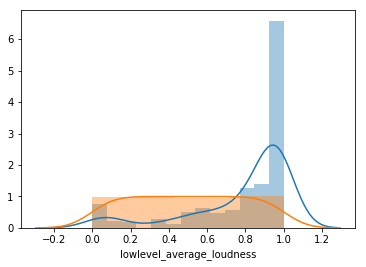

In [69]:
X_post = processing_02(config=config_data, process=processing_category, df=X_pre)

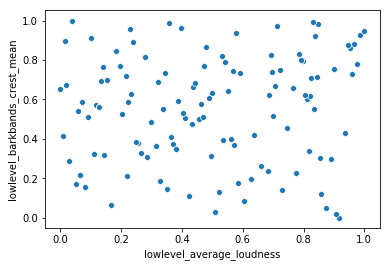

In [70]:
ax = sns.scatterplot(x=X_post.iloc[:, 0], y=X_post.iloc[:, 1], data=X_post)

In [71]:
X_post.head(10)

,lowlevel_average_loudness,lowlevel_barkbands_crest_mean,lowlevel_barkbands_crest_median,lowlevel_barkbands_crest_var,lowlevel_barkbands_flatness_db_mean,lowlevel_barkbands_flatness_db_median,lowlevel_barkbands_flatness_db_var,lowlevel_barkbands_kurtosis_mean,lowlevel_barkbands_kurtosis_median,lowlevel_barkbands_kurtosis_var,lowlevel_barkbands_skewness_mean,lowlevel_barkbands_skewness_median,lowlevel_barkbands_skewness_var,lowlevel_barkbands_spread_mean,lowlevel_barkbands_spread_median,lowlevel_barkbands_spread_var,lowlevel_dissonance_mean,lowlevel_dissonance_median,lowlevel_dissonance_var,lowlevel_dynamic_complexity,lowlevel_erbbands_crest_mean,lowlevel_erbbands_crest_median,lowlevel_erbbands_crest_var,lowlevel_erbbands_flatness_db_mean,lowlevel_erbbands_flatness_db_median,lowlevel_erbbands_flatness_db_var,lowlevel_erbbands_kurtosis_mean,lowlevel_erbbands_kurtosis_median,lowlevel_erbbands_kurtosis_var,lowlevel_erbbands_skewness_mean,lowlevel_erbbands_skewness_median,lowlevel_erbbands_skewness_var,lowlevel_erbbands_spread_mean,lowlevel_erbbands_spread_median,lowlevel_erbbands_spread_var,lowlevel_hfc_mean,lowlevel_hfc_median,lowlevel_hfc_var,lowlevel_melbands_crest_mean,lowlevel_melbands_crest_median,lowlevel_melbands_crest_var,lowlevel_melbands_flatness_db_mean,lowlevel_melbands_flatness_db_median,lowlevel_melbands_flatness_db_var,lowlevel_melbands_kurtosis_mean,lowlevel_melbands_kurtosis_median,lowlevel_melbands_kurtosis_var,lowlevel_melbands_skewness_mean,lowlevel_melbands_skewness_median,lowlevel_melbands_skewness_var,lowlevel_melbands_spread_mean,lowlevel_melbands_spread_median,lowlevel_melbands_spread_var,lowlevel_pitch_salience_mean,lowlevel_pitch_salience_median,lowlevel_pitch_salience_var,lowlevel_spectral_centroid_mean,lowlevel_spectral_centroid_median,lowlevel_spectral_centroid_var,lowlevel_spectral_complexity_mean,lowlevel_spectral_complexity_median,lowlevel_spectral_complexity_var,lowlevel_spectral_decrease_mean,lowlevel_spectral_decrease_median,lowlevel_spectral_decrease_var,lowlevel_spectral_energy_mean,lowlevel_spectral_energy_median,lowlevel_spectral_energy_var,lowlevel_spectral_energyband_low_mean,lowlevel_spectral_energyband_low_median,lowlevel_spectral_energyband_low_var,lowlevel_spectral_energyband_middle_high_mean,lowlevel_spectral_energyband_middle_high_median,lowlevel_spectral_energyband_middle_high_var,lowlevel_spectral_energyband_middle_low_mean,lowlevel_spectral_energyband_middle_low_median,lowlevel_spectral_energyband_middle_low_var,lowlevel_spectral_entropy_mean,lowlevel_spectral_entropy_median,lowlevel_spectral_entropy_var,lowlevel_spectral_flux_mean,lowlevel_spectral_flux_median,lowlevel_spectral_flux_var,lowlevel_spectral_kurtosis_mean,lowlevel_spectral_kurtosis_median,lowlevel_spectral_kurtosis_var,lowlevel_spectral_rms_mean,lowlevel_spectral_rms_median,lowlevel_spectral_rms_var,lowlevel_spectral_rolloff_mean,lowlevel_spectral_rolloff_median,lowlevel_spectral_rolloff_var,lowlevel_spectral_skewness_mean,lowlevel_spectral_skewness_median,lowlevel_spectral_skewness_var,lowlevel_spectral_spread_mean,lowlevel_spectral_spread_median,lowlevel_spectral_spread_var,lowlevel_spectral_strongpeak_mean,lowlevel_spectral_strongpeak_median,lowlevel_spectral_strongpeak_var,lowlevel_zerocrossingrate_mean,lowlevel_zerocrossingrate_median,lowlevel_zerocrossingrate_var,lowlevel_barkbands_mean_0,lowlevel_barkbands_mean_1,lowlevel_barkbands_mean_2,lowlevel_barkbands_mean_3,lowlevel_barkbands_mean_4,lowlevel_barkbands_mean_5,lowlevel_barkbands_mean_6,lowlevel_barkbands_mean_7,lowlevel_barkbands_mean_8,lowlevel_barkbands_mean_9,lowlevel_barkbands_mean_10,lowlevel_barkbands_mean_11,lowlevel_barkbands_mean_12,lowlevel_barkbands_mean_13,lowlevel_barkbands_mean_14,lowlevel_barkbands_mean_15,lowlevel_barkbands_mean_16,lowlevel_barkbands_mean_17,lowlevel_barkbands_mean_18,lowlevel_barkbands_mean_19,lowlevel_barkbands_mean_20,lowlevel_barkbands_mean_21,lowlevel_barkbands_mean_22,lowlevel_barkbands_mean_23,lowlevel_barkbands_me

In [72]:
X_post.shape

(225, 703)

# ML

In [73]:
from sklearn.svm import SVC

In [74]:
2**-11

0.00048828125

In [75]:
2**7

128

In [76]:
svm = SVC(C=2**config_data["svc_C"], 
          kernel=config_data["svc_kernel"], 
          gamma=2**config_data["svc_gamma"], 
          class_weight=config_data["svc_class_weight_balance"], 
          probability=config_data["svc_probability"])

In [77]:
from sklearn.model_selection import KFold

In [78]:
kf = KFold(n_splits=config_data["gaia_kfold_cv_n_splits"],
           shuffle=config_data["gaia_kfold_shuffle"],
           random_state=config_data["gaia_kfold_random_state"]
        )

In [79]:
X_post_array = X_post.values

In [80]:
type(X_post_array)

numpy.ndarray

In [81]:
X_post_array.shape

(225, 703)

In [82]:
accuracy_model = []

In [83]:
# Iterate over each train-test split
for train_index, test_index in kf.split(X_post_array):
#     print("TRAIN INDEX: ", train_index)
#     print("TEST INDEX: ", test_index)
    # Split train-test
    X_train, X_test = X_post_array[train_index], X_post_array[test_index]
    y_train, y_test = y[train_index], y[test_index]
    # Train the model
    model = svm.fit(X_train, y_train)
    # Append to accuracy_model the accuracy of the model
    accuracy_model.append(accuracy_score(y_test, model.predict(X_test), normalize=True) * 100)

# Print the accuracy
print("Accuracies in every fold iteration: {}".format(accuracy_model))
print("Mean of all the accuracies: {}".format(sum(accuracy_model) / len(accuracy_model)))

Accuracies in every fold iteration: [100.0, 100.0, 100.0, 88.88888888888889, 95.55555555555556]
Mean of all the accuracies: 96.88888888888889


# Evaluation

In [84]:
from sklearn.metrics import confusion_matrix, classification_report

In [85]:
predictions = svm.predict(X_post_array)

In [86]:
prob_predictions = svm.predict_proba(X_post_array)
prob_predictions = prob_predictions * 100  # multiply * 100 for better results

In [87]:
print("Classification Report:")
print("\n{}".format(classification_report(y, predictions)))

Classification Report:

               precision    recall  f1-score   support

    danceable       0.99      0.99      0.99       132
not_danceable       0.99      0.99      0.99        93

     accuracy                           0.99       225
    macro avg       0.99      0.99      0.99       225
 weighted avg       0.99      0.99      0.99       225



In [88]:
print("Confusion matrix:")
print("\n{}".format(confusion_matrix(y, predictions)))

Confusion matrix:

[[131   1]
 [  1  92]]


In [89]:
y.value_counts(normalize=True)

danceable        0.586667
not_danceable    0.413333
Name: danceability, dtype: float64

In [90]:
from sklearn.model_selection import cross_val_score

In [91]:
scores = cross_val_score(svm, X_post_array, y, cv=5)

In [92]:
print("Accuracy: %0.4f (+/- %0.4f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.9727 (+/- 0.0881)


# PCA evaluation

In [93]:
from sklearn.decomposition import PCA

In [94]:
pca = PCA(n_components=.95)

In [95]:
pca.fit(X_post_array)

PCA(copy=True, iterated_power='auto', n_components=0.95, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [96]:
X_pca = pca.transform(X_post_array)

In [97]:
X_pca.shape

(225, 48)

In [98]:
pca.explained_variance_ratio_

array([0.32202649, 0.15467823, 0.08634201, 0.04648848, 0.02506291,
       0.02429142, 0.02106204, 0.01889592, 0.01827153, 0.01624344,
       0.01428653, 0.0135373 , 0.012859  , 0.01184289, 0.01127514,
       0.01008103, 0.00923979, 0.00883918, 0.00815025, 0.00793481,
       0.00749487, 0.00686756, 0.00678067, 0.00636784, 0.00565344,
       0.00542865, 0.00509536, 0.00492336, 0.00476311, 0.00447859,
       0.00419483, 0.00390414, 0.00380778, 0.00357737, 0.00340489,
       0.00334019, 0.00320625, 0.00304689, 0.00280854, 0.00264783,
       0.00258401, 0.00249323, 0.00238742, 0.0022834 , 0.0022547 ,
       0.00204907, 0.00202941, 0.00193782])

In [99]:
svm_pca = SVC(C=2**config_data["svc_C"], 
          kernel=config_data["svc_kernel"], 
          gamma=2**config_data["svc_gamma"], 
          class_weight=config_data["svc_class_weight_balance"], 
          probability=config_data["svc_probability"])

In [100]:
kf_pca = KFold(n_splits=config_data["gaia_kfold_cv_n_splits"],
           shuffle=config_data["gaia_kfold_shuffle"],
           random_state=config_data["gaia_kfold_random_state"]
        )

In [101]:
# Iterate over each train-test split
for train_index, test_index in kf_pca.split(X_pca):
#     print("TRAIN INDEX: ", train_index)
#     print("TEST INDEX: ", test_index)
    # Split train-test
    X_train, X_test = X_pca[train_index], X_pca[test_index]
    y_train, y_test = y[train_index], y[test_index]
    # Train the model
    model = svm_pca.fit(X_train, y_train)
    # Append to accuracy_model the accuracy of the model
    accuracy_model.append(accuracy_score(y_test, model.predict(X_test), normalize=True) * 100)

# Print the accuracy
print("Accuracies in every fold iteration: {}".format(accuracy_model))
print("Mean of all the accuracies: {}".format(sum(accuracy_model) / len(accuracy_model)))

Accuracies in every fold iteration: [100.0, 100.0, 100.0, 88.88888888888889, 95.55555555555556, 100.0, 100.0, 100.0, 86.66666666666667, 97.77777777777777]
Mean of all the accuracies: 96.88888888888889


In [102]:
predictions_pca = svm_pca.predict(X_pca)

In [103]:
print("Classification Report:")
print("\n{}".format(classification_report(y, predictions_pca)))

Classification Report:

               precision    recall  f1-score   support

    danceable       0.99      0.99      0.99       132
not_danceable       0.99      0.99      0.99        93

     accuracy                           0.99       225
    macro avg       0.99      0.99      0.99       225
 weighted avg       0.99      0.99      0.99       225



In [104]:
print("Confusion matrix:")
print("\n{}".format(confusion_matrix(y, predictions_pca)))

Confusion matrix:

[[131   1]
 [  1  92]]


In [105]:
scores_pca = cross_val_score(svm_pca, X_pca, y, cv=5)

In [106]:
print("Accuracy: %0.4f (+/- %0.4f)" % (scores_pca.mean(), scores_pca.std() * 2))

Accuracy: 0.9682 (+/- 0.1060)


In [107]:
from sklearn.model_selection import GridSearchCV